In [2]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import random as rd
from IPython.display import clear_output
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

In [5]:
#getting datasets
tfds.list_builders()                            #get list of datasets

(raw_train, raw_validation, raw_test), metadata = tfds.load("cats_vs_dogs", as_supervised=True, with_info=True,  split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'])
#get label name
label_names=metadata.features["label"].int2str

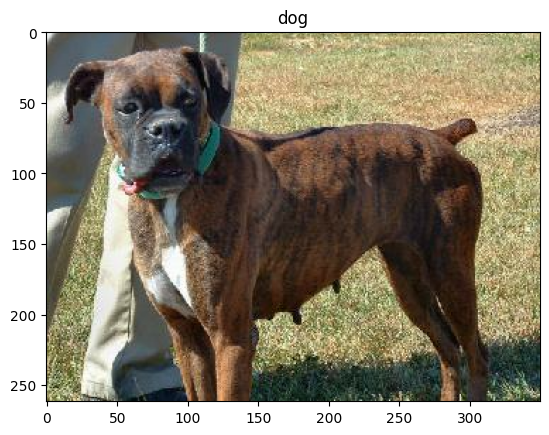

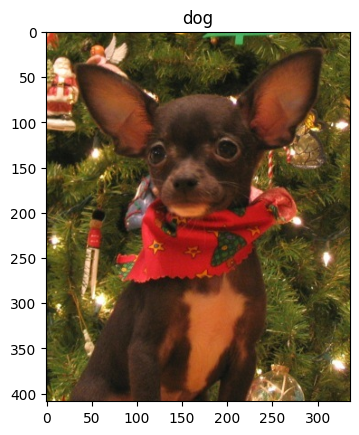

In [6]:
#display 2 images from the dataset
i=0
for image, label in raw_train:
    plt.figure()
    plt.imshow(image)
    plt.title(label_names(label))
    i+=1
    if i==2:
        break

In [8]:
#data preproccessing
size=160

def changeimg(image, label,):
    image = tf.cast(image, tf.float32)
    image = (image/255.0)
    image = tf.image.resize(image, (size, size))
    return image, label

def changeimgreturnimgonly(image, label):
    image = tf.cast(image, tf.float32)
    image = (image/255.0)
    image = tf.image.resize(image, (size, size))
    return image

train=raw_train.map(changeimg)
validation=raw_validation.map(changeimg)
test=raw_test.map(changeimgreturnimgonly)

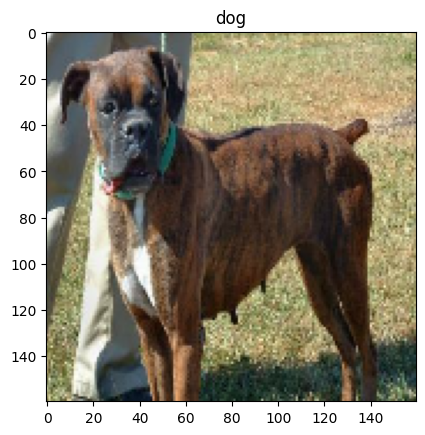

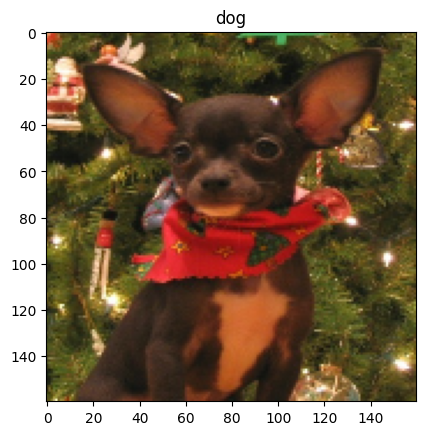

In [11]:
#testing data after preproccess
for data, label in train.take(2):
    plt.figure()
    plt.imshow(data)
    plt.title(label_names(label))

In [9]:
#turning the datas into batch

batch_size=32
shufflesize=1000

train_batches=train.shuffle(shufflesize).batch(batch_size)
validation_batches=validation.batch(batch_size)
test_batches=test.batch(batch_size)

In [70]:
#Using a pretrained model (MobileNetV2)
img_shape= (size, size, 3)

mobilenetmodel=keras.applications.MobileNetV2(input_shape=img_shape, include_top=False)

In [34]:
#model will simply output a shape (32, 5, 5, 1280) tensor that is a feature extraction from our original (1, 160, 160, 3) image. The 32 means that we have 32 layers of differnt filters/features.

for image, _ in train_batches.take(1):
   pass

feature_batch = mobilenetmodel(image)
print(feature_batch.shape)

(32, 5, 5, 1280)


In [35]:
mobilenetmodel.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 160, 160, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 80, 80, 32)           864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 80, 80, 32)           128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 80, 80, 32)           0         ['bn_Conv1[

In [71]:
#freeezing the base
'''
 freezing refers to disabling the training property of a layer. It simply means we won’t make any changes to the weights of any 
 layers that are frozen during training. This is important as we don't want to change the convolutional base that already has 
 learned weights.
 '''
 
mobilenetmodel.trainable=False
mobilenetmodel.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 160, 160, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 80, 80, 32)           864       ['input_3[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 80, 80, 32)           128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 80, 80, 32)           0         ['bn_Conv1[

In [72]:
#adding a classifier for our image!
'''Instead of flattening the feature map of the base layer we will use a global average pooling layer that will 
average the entire 5x5 area of each 2D feature map and return to us a single 1280 element vector per filter.'''

model= keras.Sequential([mobilenetmodel,
                         keras.layers.GlobalAveragePooling2D(),
                         keras.layers.Dense(1, activation=keras.activations.sigmoid)])
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_160 (Func  (None, 5, 5, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_2  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_4 (Dense)             (None, 1)                 1281      
                                                                 
Total params: 2259265 (8.62 MB)
Trainable params: 1281 (5.00 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [74]:
#evaluating the model!

model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=0.0001),
              loss=keras.losses.BinaryCrossentropy(from_logits=True), metrics=["accuracy"])

In [42]:
model.evaluate(validation_batches, steps=20)

20/20 [==============================] - 12s 421ms/step - loss: 1.1508 - accuracy: 0.4828


[1.1508209705352783, 0.4828124940395355]

In [75]:
model.fit(train_batches, epochs=3, validation_data=validation_batches)

Epoch 1/3


C:\Users\Rhey\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\backend.py:5805: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


582/582 [==============================] - 263s 438ms/step - loss: 0.2301 - accuracy: 0.9136 - val_loss: 0.1138 - val_accuracy: 0.9630
Epoch 2/3
582/582 [==============================] - 252s 431ms/step - loss: 0.0945 - accuracy: 0.9675 - val_loss: 0.0855 - val_accuracy: 0.9690
Epoch 3/3
582/582 [==============================] - 254s 434ms/step - loss: 0.0777 - accuracy: 0.9723 - val_loss: 0.0745 - val_accuracy: 0.9712


In [21]:
#save and load format (.h5)

#saving model
model.save("dogs_vs_cats.h5")  # we can save the model and reload it at anytime in the future

AttributeError: 'History' object has no attribute 'save'

In [4]:
#load model!
new_model = tf.keras.models.load_model('dogs_vs_cats.h5')

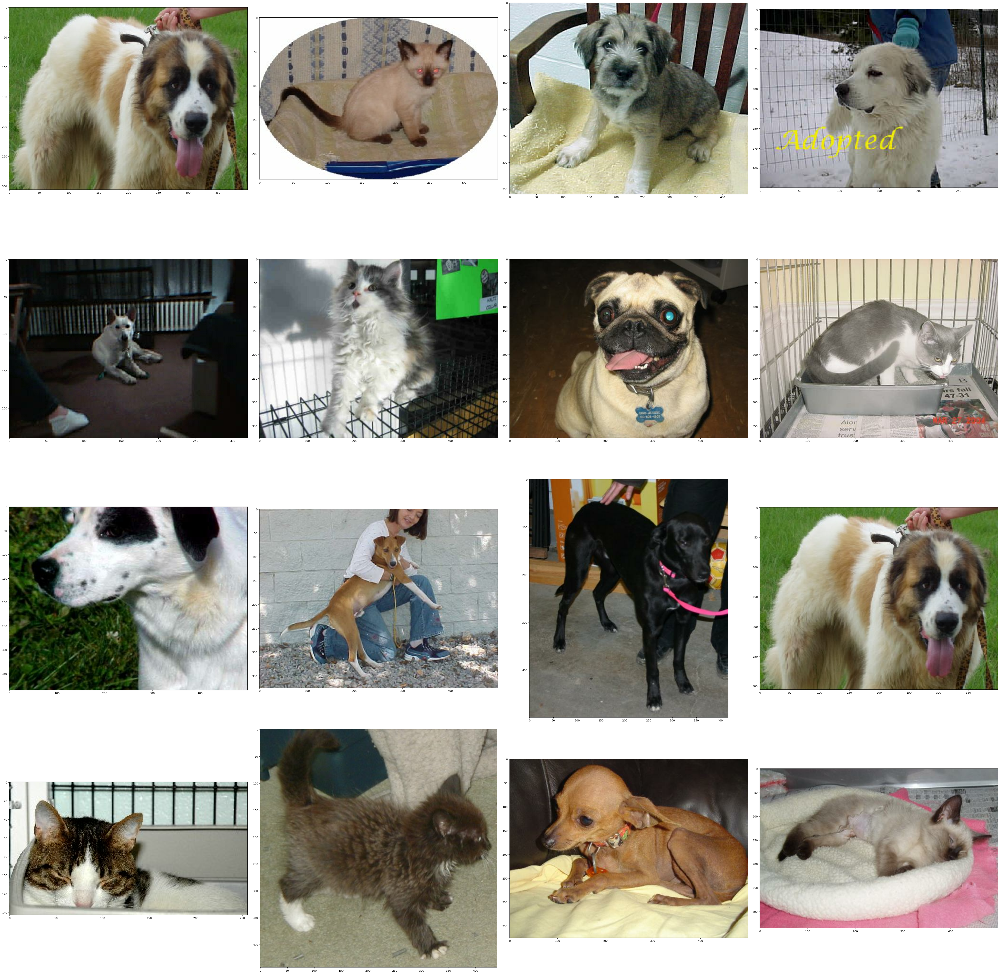

In [23]:
#predicted vs actual (visualize!)

fig= plt.figure(figsize=(50,50))
fig.subplots_adjust(0,0,1,1,0.05,0.05)

for i in range(16):
    randint=rd.randint(0, 2000)
    ax= fig.add_subplot(4, 4, i+1)
    z=0
    for temp, _ in raw_test.take(2000):
        z+=1
        if z==randint: break
    ax.imshow(temp)

clear_output()
plt.show()